Идеи:<br>
1) Предсказывать четыре resp, а не один и как-то использовать корреляцию<br>
2) Стоит ли брать в обучение weight == 0? <br>
3) Использовать time series (LSTM?) <br>
4) Feature Engineering в зависимости от тегов <br>
5) Поработать с пропусками <br>
6) Посмотреть на снижение размерности <br>
7) Решать как задачу регрессии <br>

In [1]:
!pip install trimap

     |████████████████████████████████| 5.6 MB 4.4 MB/s 
  Created wheel for trimap: filename=trimap-1.0.14-py3-none-any.whl size=14634 sha256=5ec2cb0ce833b805390fa734ab4edabac5f75cf046f8ade17f6b2bb203196c08
  Stored in directory: /root/.cache/pip/wheels/31/a6/ba/c9abb708613cfdec6589cd11257fdb8ebce2c530e8525102b1
Successfully built trimap


In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import trimap
colorMap = sns.light_palette("blue", as_cmap=True)
import datatable as dt
import warnings
warnings.filterwarnings('ignore')
import os

## Load Data

In [3]:
%%time
train_data_datatable = dt.fread('/kaggle/input/jane-street-market-prediction/train.csv')
train_data = train_data_datatable.to_pandas()
train_data.shape

CPU times: user 27.3 s, sys: 7.71 s, total: 35 s
Wall time: 59 s


(2390491, 138)

In [4]:
train_data.head()

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009916,0.014079,0.008773,0.001390,0.006270,1,-1.872746,-2.191242,...,NaN,1.168391,8.313583,1.782433,14.018213,2.653056,12.600292,2.301488,11.445807,0
1,0,16.673515,-0.002828,-0.003226,-0.007319,-0.011114,-0.009792,-1,-1.349537,-1.704709,...,NaN,-1.178850,1.777472,-0.915458,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.025134,0.027607,0.033406,0.034380,0.023970,-1,0.812780,-0.256156,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,0,0.000000,-0.004730,-0.003273,-0.000461,-0.000476,-0.003200,-1,1.174378,0.344640,...,NaN,2.838853,0.499251,3.033732,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,0,0.138531,0.001252,0.002165,-0.001215,-0.006219,-0.002604,1,-3.172026,-3.093182,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4


## Metrics

<b> Used Notebooks: </b><br>
    1) Score Function - https://www.kaggle.com/renataghisloti/understanding-the-utility-score-function

<b> What our objective function? </b><br>
$p_i=\sum \limits_j(weight_{ij}∗resp_{ij}∗action_{ij})$ <br>
$ t = \frac{\sum p_i} {\sqrt {\sum p_i^2}} * \sqrt {\frac {250} {|i|}}$, where |i| - number of unique dates<br>
$ u = min(max(t, 0), 6) \sum p_i)$, where u - objective, which we want maximize

Из формул выше видно, что мы бы хотели максимизировать u, а для этого надо максимизировать $ \sum p_i $. Так как признака action у нас нет, нам необходимо определить его таким образом, чтобы это максимизировало $ \sum p_i $. Можем это сделать задав его бинарной переменной в зависимости от того положительный ли resp.

Если смотреть на t, то нам нужно стремиться к как можно меньшей вариации по дням, не очень понятно как этого достичь. Кроме того исходя из формулы для u нам нет смысла брать t > 6. Фактически мы ищем что-то вроде коэффициента Шарпа, который очень маловероятно будет выше 6, поэтому и такое ограничение (скорее всего). В целом наша метрика это просто попытка максимизировать произведение коэффициента Шарпа и общей прибыли.

In [5]:
# построим признак action, который нам и нужен, а также зададим features
train_data['action'] = (train_data['resp'] > 0).astype('int')
features = [col for col in train_data.columns if 'feature' in col]

## EDA

<b> Used Notebooks:</b><br>
    1) Visualization - https://www.kaggle.com/carlmcbrideellis/jane-street-eda-of-day-0-and-feature-importance <br>
    2) Feature0 - https://www.kaggle.com/nanomathias/feature-0-beyond-feature-0 <br>

Я взял часть визуализации, которая мне показалась интересной и оставил некоторые комментарии

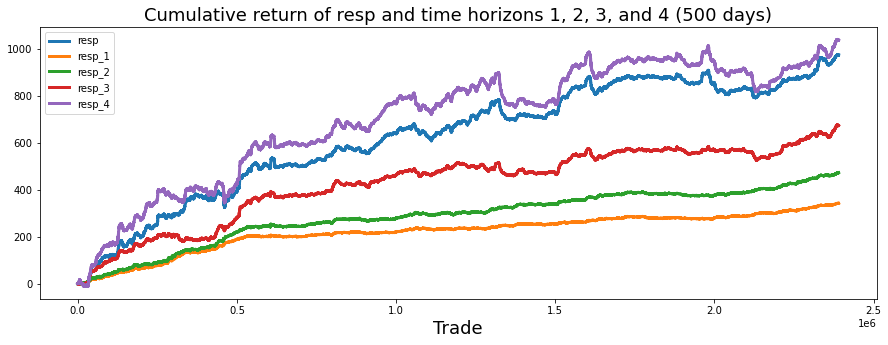

In [6]:
'''
Ближе всего к итоговому ответу resp_4, в целом этот признак очень сильно с ним коррелирован, можно даже посмотреть
их корреляцию и потом это как-то использовать как feature engineering и например предсказывать не только resp, а
resp_i по всем i, может будет работать
'''
fig, ax = plt.subplots(figsize=(15, 5))
balance = pd.Series(train_data['resp']).cumsum()
resp_1 = pd.Series(train_data['resp_1']).cumsum()
resp_2 = pd.Series(train_data['resp_2']).cumsum()
resp_3 = pd.Series(train_data['resp_3']).cumsum()
resp_4 = pd.Series(train_data['resp_4']).cumsum()
ax.set_xlabel ("Trade", fontsize=18)
ax.set_title ("Cumulative return of resp and time horizons 1, 2, 3, and 4 (500 days)", fontsize=18)
balance.plot(lw=3)
resp_1.plot(lw=3)
resp_2.plot(lw=3)
resp_3.plot(lw=3)
resp_4.plot(lw=3)
plt.legend(loc="upper left");

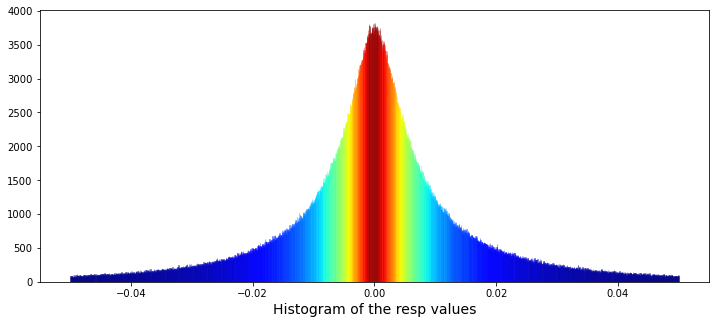

In [7]:
'''
Больше 90% resp лежат от -0.05 до +0.05. Мне кажется это тоже может быть полезной информацией, а внизу просто 
красивый график.
'''

plt.figure(figsize = (12,5))
ax = sns.distplot(train_data['resp'], 
                  bins=3000, 
                  kde_kws={"clip":(-0.05,0.05)}, 
                  hist_kws={"range":(-0.05,0.05)},
                  color='darkcyan', 
                  kde=False);
values = np.array([rec.get_height() for rec in ax.patches])
norm = plt.Normalize(values.min(), values.max())
colors = plt.cm.jet(norm(values))
for rec, col in zip(ax.patches, colors):
    rec.set_color(col)
plt.xlabel("Histogram of the resp values", size=14)
plt.show()

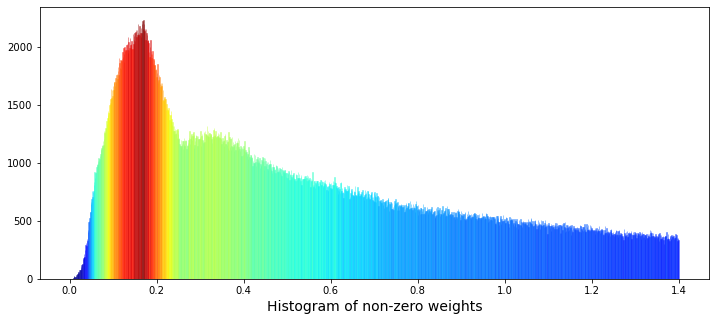

In [8]:
'''
Из weights тоже можно вытащить какую-то информацию.
Во-первых они больше нуля, а те веса, которые равны нулю, их около 17%, и они по идее не вносят вклад в итоговый скоре
Во-вторых мы видим два пика и автор этой визуализации делает предположение о том, что возможно это тоже можно использовать
'''
plt.figure(figsize = (12,5))
ax = sns.distplot(train_data['weight'], 
             bins=1400, 
             kde_kws={"clip":(0.001,1.4)}, 
             hist_kws={"range":(0.001,1.4)},
             color='darkcyan', 
             kde=False);
values = np.array([rec.get_height() for rec in ax.patches])
norm = plt.Normalize(values.min(), values.max())
colors = plt.cm.jet(norm(values))
for rec, col in zip(ax.patches, colors):
    rec.set_color(col)
plt.xlabel("Histogram of non-zero weights", size=14)
plt.show()

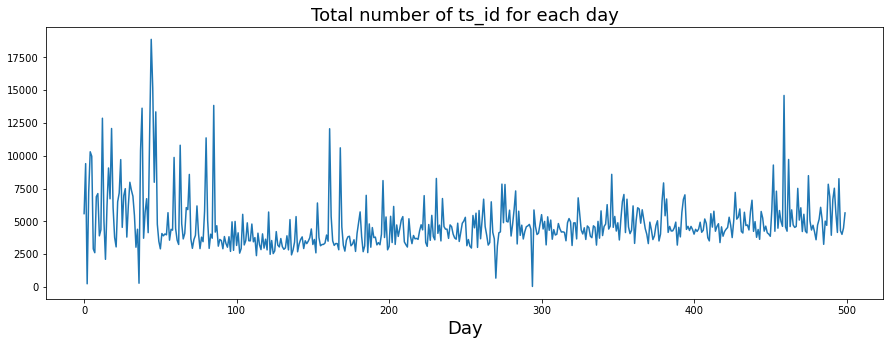

In [9]:
'''
Наши данные это временной ряд и мы можем посмотреть как менялось количество операций во времени.
В целом это может быть довольно важной информацией и мы можем это как-то использовать
'''
trades_per_day = train_data.groupby(['date'])['ts_id'].count()
fig, ax = plt.subplots(figsize=(15, 5))
plt.plot(trades_per_day)
ax.set_xlabel ("Day", fontsize=18)
ax.set_title ("Total number of ts_id for each day", fontsize=18)
plt.show()

#### Features

Features - это наши основные входные данные. В основном это просто какие-то цифры. На их фоне неплохо выделяется feature_0, которая принимает значения -1 и 1 и для некоторых features разделяет их на отрицательные и не отрицательные.

In [10]:
def plotFeatureSplits(df, feature_list):
    for i in feature_list:

        # Create a plot with original timeseries, and split by feature 0
        _, axes = plt.subplots(1, 2, figsize=(20, 5))

        # Original timeseries
        df[f'feature_{i}'].plot(ax=axes[0])
        axes[0].set_title(f'Feature {i}')
        axes[0].set_ylabel(f'Feature {i}')
        axes[0].set_xlabel(f'Trade ID')

        # Plot by feature 0 split
        df.groupby('feature_0')[f'feature_{i}'].plot(ax=axes[1])
        axes[1].set_title(f'Feature {i}, split by feature_0')
        axes[1].set_ylabel(f'Feature {i}')
        axes[1].set_xlabel(f'Trade ID')

        # Show figure with legend
        plt.legend()    
        plt.show()

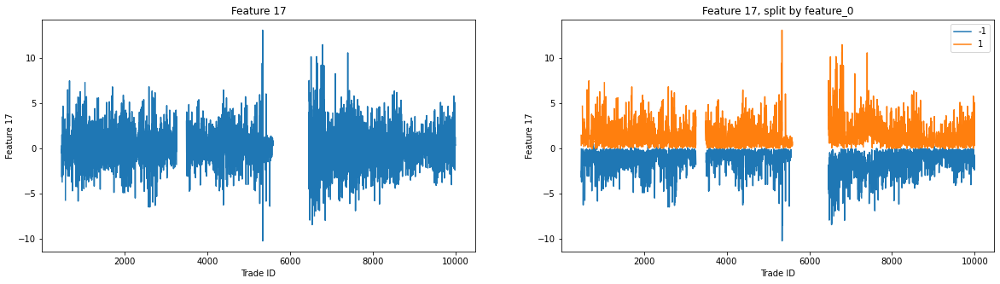

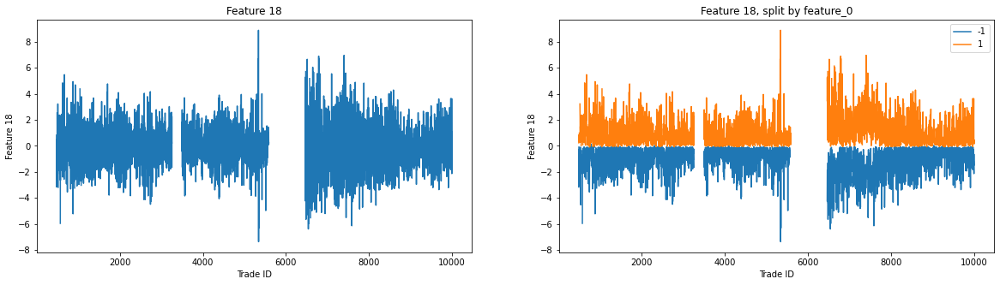

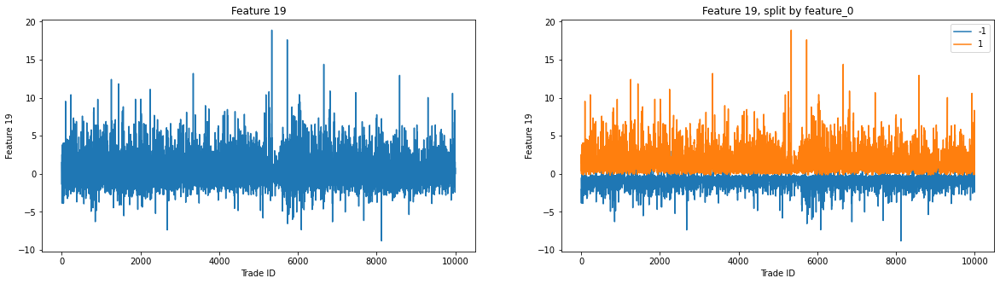

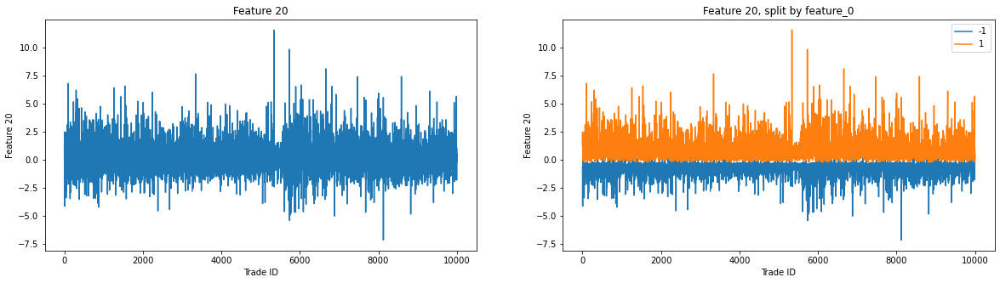

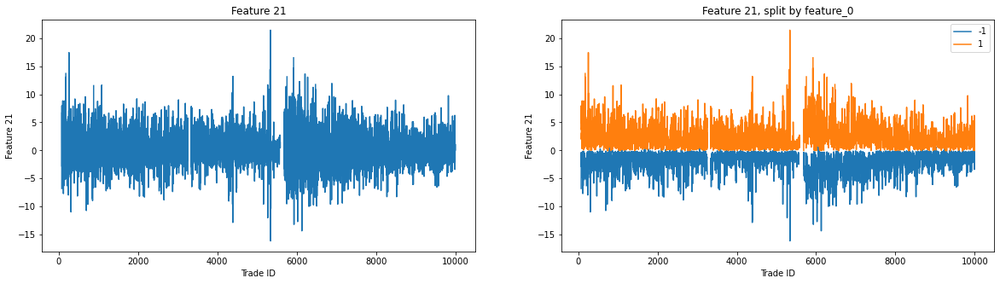

...

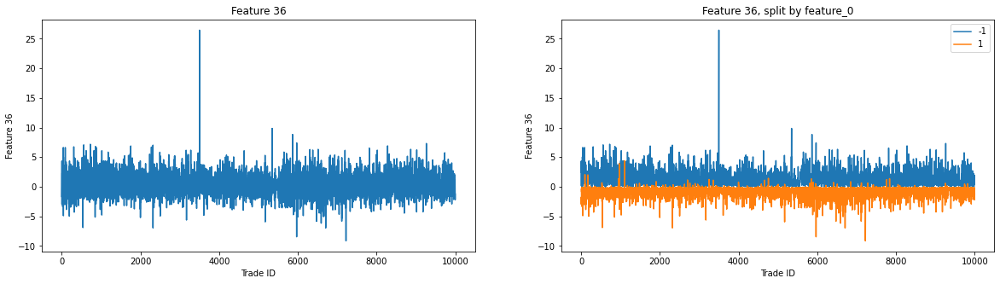

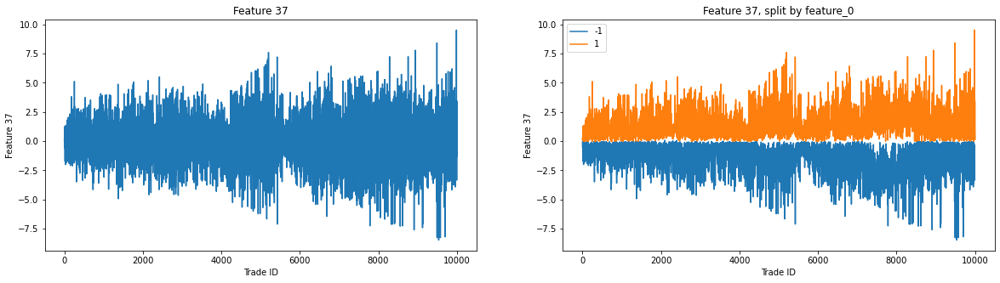

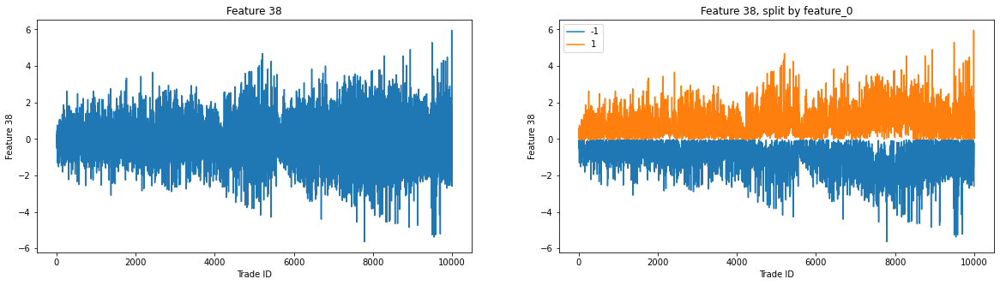

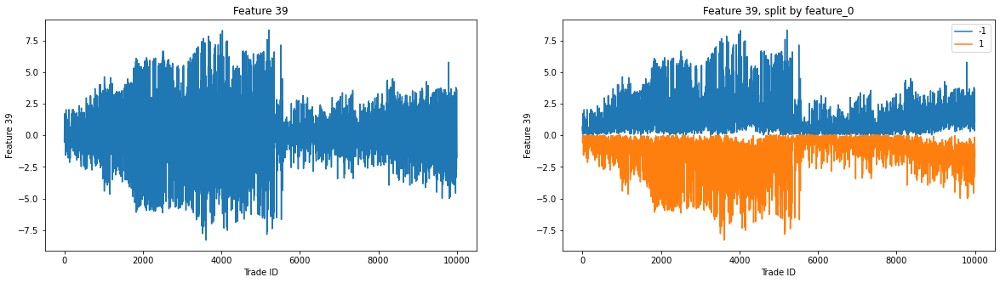

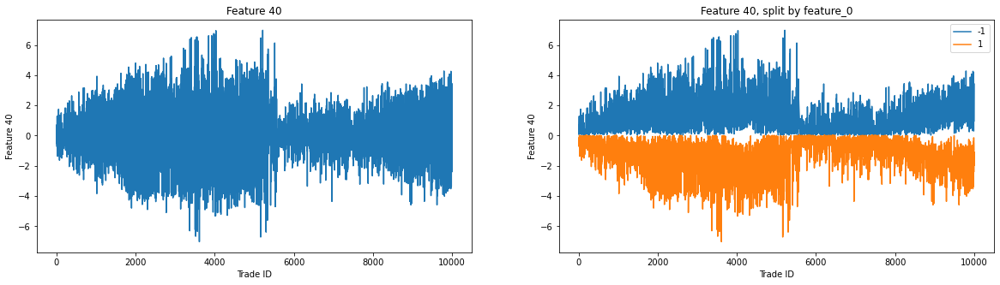

In [11]:
# Show pattern 1, features 17-40
plotFeatureSplits(train_data.iloc[:10000, :], np.arange(17, 41))

In [12]:
%%time
data_viz = train_data.fillna(0).sample(frac=0.1)
means = np.nanmean(data_viz[features], axis=0)
stds = np.nanstd(data_viz[features], axis=0)
data_viz = (data_viz[features] - means) / stds

CPU times: user 2.44 s, sys: 2.15 s, total: 4.59 s
Wall time: 4.61 s


In [13]:
%%time
# Create TriMap embeddings
trimap_embedding = trimap.TRIMAP(
  n_iters=1000,
  apply_pca=True,
  weight_adj=50
).fit_transform(data_viz.values)
print("Done with TriMap embeddings")

# Put embeddings into dataframe
embedding_df = pd.DataFrame({
    'Component 1': trimap_embedding[:, 0], 
    'Component 2': trimap_embedding[:, 1],
    'Feature 0': data_viz.feature_0.astype(str),
})

# Visualize the embeddings in 2D plot
fig = px.scatter(
    embedding_df, 
    x='Component 1', y='Component 2', 
    color='Feature 0',
    opacity=0.8
)
fig.update_traces(
    marker=dict(size=5, line=dict(width=1, color='DarkSlateGrey')),
    selector=dict(mode='markers')
)    
fig.update_layout(title={
    'text': f'TriMAP Embedding on Features 1-{len(features)+1}',
    'x':0.5,
    'xanchor': 'center',
    'yanchor': 'top'}
)
fig.show()

TRIMAP(n_inliers=10, n_outliers=5, n_random=5, distance=euclidean, lr=1000.0, n_iters=1000, weight_adj=50, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 239049 points with dimension 130
pre-processing
applied PCA
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 1260.473, Violated triplets: 0.0096
Iteration:  200, Loss: 1111.604, Violated triplets: 0.0085
Iteration:  300, Loss: 1041.757, Violated triplets: 0.0079
Iteration:  400, Loss: 1006.313, Violated triplets: 0.0077
Iteration:  500, Loss: 988.444, Violated triplets: 0.0075
Iteration:  600, Loss: 976.912, Violated triplets: 0.0074
Iteration:  700, Loss: 968.706, Violated triplets: 0.0074
Iteration:  800, Loss: 962.516, Violated triplets: 0.0073
Iteration:  900, Loss: 957.653, Violated triplets: 0.0073
Iteration: 1000, Loss: 953.696, Violated triplets: 0.0073
Elapsed time: 0:11:36.617167
Done with TriMap embeddings


CPU times: user 11min 37s, sys: 1.77 s, total: 11min 39s
Wall time: 11min 40s


In [14]:
'''
Features могут быть четырех типов в зависимости от их куммулятивной суммы: linear, negative, noisy, hybrid.
Пока не понятно что делать с feature engineering, но стоит записать какие переменные к какому типу относятся
'''
linear = [1, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 18, 20, 22, 24, 26, 27, 29, 21, 33, 35, 28, 30, 32, 34, 36,
          84, 85, 86, 87, 88, 90, 91, 92, 93, 94, 96, 97, 98, 99, 100, 102, 103, 104, 105, 106, 41, 46, 47, 48, 49,
          50, 51, 53, 54, 69, 89, 95, 101, 107, 108, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 122, 124]
noisy = [3, 4, 5, 6, 8, 10, 12, 14, 16, 37, 38, 39, 40, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83]
negative = [73, 75, 76, 77, 79, 81, 82]
hybrid = [55, 56, 57, 58, 59]

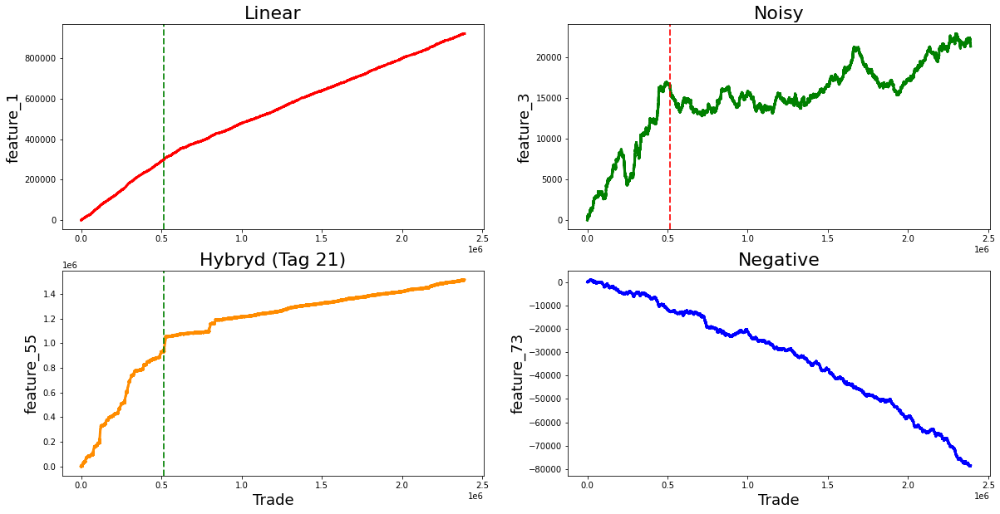

In [15]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(20,10))

ax1.plot((pd.Series(train_data['feature_1']).cumsum()), lw=3, color='red')
ax1.set_title ("Linear", fontsize=22);
ax1.axvline(x=514052, linestyle='--', alpha=0.85, c='green', lw=2)
ax1.set_ylabel ("feature_1", fontsize=18);

ax2.plot((pd.Series(train_data['feature_3']).cumsum()), lw=3, color='green')
ax2.set_title ("Noisy", fontsize=22);
ax2.axvline(x=514052, linestyle='--', alpha=0.85, c='red', lw=2)
ax2.set_ylabel ("feature_3", fontsize=18);

ax3.plot((pd.Series(train_data['feature_55']).cumsum()), lw=3, color='darkorange')
ax3.set_title ("Hybryd (Tag 21)", fontsize=22);
ax3.set_xlabel ("Trade", fontsize=18)
ax3.axvline(x=514052, linestyle='--', alpha=0.85, c='green', lw=2)
ax3.set_ylabel ("feature_55", fontsize=18);

ax4.plot((pd.Series(train_data['feature_73']).cumsum()), lw=3, color='blue')
ax4.set_title ("Negative", fontsize=22)
ax4.set_xlabel ("Trade", fontsize=18)
ax4.set_ylabel ("feature_73", fontsize=18);

In [16]:
'''
Еще есть файл с тегами, скорее всего feature engineering стоит основывать на нем
'''
feature_tags = pd.read_csv("/kaggle/input/jane-street-market-prediction/features.csv" ,index_col=0)
feature_tags = feature_tags*1
tag_sum = pd.DataFrame(feature_tags.T.sum(axis=0),columns=['Number of tags'])
tag_sum.T

feature,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_120,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129
Number of tags,0,2,3,2,3,2,3,3,4,3,...,2,3,2,3,2,3,2,3,2,3


In [17]:
'''
По пропущенным фичам есть зависимости от количества пропусков и номеров этих фичей, в дальнейшем надо будет тоже с этим
поработать и посмотреть как все это соотносится с тегами
'''

gone = train_data.isna().sum()
px.bar(gone, color=gone.values, title="Total number of missing values for each column").show()

In [18]:
del ax, ax1, ax2, ax3, ax4, balance, col, colorMap, colors, data_viz, dt, embedding_df, feature_tags, features, fig, go, gone, hybrid,linear,means,negative,noisy,norm,np,os,pd,plotFeatureSplits,plt,px,rec,resp_1,resp_2,resp_3,resp_4,sns,stds,tag_sum,trades_per_day,train_data,train_data_datatable,trimap,trimap_embedding,values,warnings
%who

Interactive namespace is empty.


## Trees and Gradient Boosting

In [19]:
import numpy as np
import pandas as pd
import datatable as dt

<b> Used Notebooks:</b><br>
    1) XGB-Starter - https://www.kaggle.com/wilddave/xgb-starter <br>
    2) XGBoost HyperOpt - https://www.kaggle.com/gogo827jz/jane-street-xgboost-grouptimesplitkfold?scriptVersionId=48297430 <br>
    3) NN1 - https://www.kaggle.com/mukuldsagupta/jane-street-eda-model-neural-network <br>
    4) NN2 - https://www.kaggle.com/gogo827jz/jane-street-neural-network-starter <br>
    5) XGB - https://www.kaggle.com/nanomathias/xgboost-risk-based-weighted-predictions <br>
    6) XGB on GPU - https://www.kaggle.com/nanomathias/xgboost-risk-based-weighted-predictions <br>

Основная проблема в том, что данных у нас достаточно много, рабочий ноутбук не особо вытягивает по оперативке так что я взял свой. Также не понятно сколько оно будет обучаться если просто запустить Random Forest из sklearn, то приходится пытаться все это ускорить, не знаю что получится в итоге, но попробовать интересно.

### Random Forest

Попробуем на pyspark, в целом вряд ли получится что-то очень качественное, но почему бы и нет

In [20]:
!pip install pyspark

     |████████████████████████████████| 204.2 MB 28 kB/s 
     |████████████████████████████████| 198 kB 48.4 MB/s 
  Created wheel for pyspark: filename=pyspark-3.0.1-py2.py3-none-any.whl size=204612244 sha256=18d46fceafdd28a2e1e72a89dbd793067021a005d8b48cbe7bd9618833d71956
  Stored in directory: /root/.cache/pip/wheels/5e/34/fa/b37b5cef503fc5148b478b2495043ba61b079120b7ff379f9b
Successfully built pyspark


In [21]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lit, isnan, when
from pyspark.sql.types import IntegerType, FloatType, StructType,StructField, BinaryType
from pyspark.ml.feature import StandardScaler, VectorAssembler, PCA
spark = SparkSession.builder.getOrCreate()

In [22]:
%%time
df = spark.read.csv('/kaggle/input/jane-street-market-prediction/train.csv', header=True)
schema = StructType([StructField(col, FloatType(),True) for col in df.columns])
df = spark.read.csv('/kaggle/input/jane-street-market-prediction/train.csv', header=True, schema=schema)
print((df.count(), len(df.columns)))

(2390491, 138)
CPU times: user 18.5 ms, sys: 6.21 ms, total: 24.7 ms
Wall time: 44.3 s


In [23]:
# very simple preprocessing
df = df.filter(col('weight')!=0)
df = df.withColumn('action', when(df['resp'] > 0.0, 1.0).otherwise(0.0))
features = [col for col in df.columns if 'feature' in col]
df = df.fillna(-9999)
print('Распределение action')
df.groupby('action').count().show()

Распределение action
+------+------+
|action| count|
+------+------+
|   0.0|981900|
|   1.0|999387|
+------+------+



In [24]:
assembler = VectorAssembler(inputCols=features, outputCol='features')
df = assembler.transform(df).select('action', 'features')
train, test = df.randomSplit(weights=[0.8, 0.2])

In [25]:
from pyspark.ml.classification import RandomForestClassifier
rf = RandomForestClassifier(featuresCol='features', labelCol='action')

In [26]:
%%time
model = rf.fit(train)

CPU times: user 167 ms, sys: 65.2 ms, total: 232 ms
Wall time: 12min 13s


In [27]:
predictions = model.transform(test)
predictions = predictions.withColumn('label', col('action'))
predictions.limit(5).toPandas()

,action,features,rawPrediction,probability,prediction,label
0,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[9.212106006049789, 10.787893993950211]","[0.4606053003024894, 0.5393946996975105]",1.0,0.0
1,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[9.091885915060516, 10.908114084939482]","[0.4545942957530258, 0.5454057042469741]",1.0,0.0
2,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[9.659635560058545, 10.340364439941457]","[0.48298177800292724, 0.5170182219970728]",1.0,0.0
3,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[9.718154985676732, 10.281845014323268]","[0.48590774928383657, 0.5140922507161634]",1.0,0.0
4,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[9.542684409661728, 10.457315590338272]","[0.4771342204830864, 0.5228657795169136]",1.0,0.0


In [28]:
%%time
from pyspark.ml.evaluation import BinaryClassificationEvaluator
evaluator = BinaryClassificationEvaluator()
print("Test Area Under ROC: " + str(evaluator.evaluate(predictions, {evaluator.metricName: "areaUnderROC"})))

Test Area Under ROC: 0.5284123981621925
CPU times: user 41.1 ms, sys: 15.4 ms, total: 56.4 ms
Wall time: 2min 45s


In [29]:
feature_importances = dict(zip(model.featureImportances.indices, model.featureImportances.values))
dict(sorted(feature_importances.items(), key=lambda x: x[1], reverse=True))

{39: 0.064587979892334,
 27: 0.05261828172765988,
 33: 0.049899577571414014,
 107: 0.045914380167704535,
 31: 0.04362858698106408,
 116: 0.038009249517115984,
 0: 0.03669278688544706,
 29: 0.03555891450786068,
 28: 0.03014864849353461,
 43: 0.03002938858162682,
 20: 0.02930975341071573,
 45: 0.023920715093884756,
 40: 0.0229562529194823,
 119: 0.02014714398084494,
 34: 0.01907724593886263,
 102: 0.017852926665271173,
 8: 0.017328740141935226,
 42: 0.015933978771915148,
 62: 0.013914438760310323,
 92: 0.013159032789969844,
 37: 0.012858998874872444,
 95: 0.012362057214577442,
 87: 0.012169594780598673,
 69: 0.011581175583140367,
 114: 0.01148204589735195,
 35: 0.011356435518132679,
 7: 0.010682792057857186,
 96: 0.010178502687774461,
 11: 0.009878979254025595,
 18: 0.00981296261119359,
 5: 0.009504997096965942,
 83: 0.00950404752957061,
 90: 0.008912949790703421,
 71: 0.008557988192869195,
 86: 0.008556567270119646,
 10: 0.007912351127967645,
 108: 0.0076369691498662335,
 12: 0.00750016

Выглядит очень плохо, мы фактически ничего не предсказываем, попробуем применить PCA, но конечно в этой задаче нейронки справляются намного лучше.

In [30]:
%%time
pca_model = PCA(k=5, inputCol="features", outputCol="pca")
pca_transformation = pca_model.fit(df).transform(df)

CPU times: user 71.2 ms, sys: 26.9 ms, total: 98 ms
Wall time: 5min 23s


In [31]:
pca_transformation.show(5)

+------+--------------------+--------------------+
|action|            features|                 pca|
+------+--------------------+--------------------+
|   0.0|[-1.0,-1.34953701...|[46243.8063259658...|
|   0.0|[1.0,-3.172026395...|[46243.6172660715...|
|   1.0|[-1.0,-3.17202639...|[46243.8795305608...|
|   1.0|[-1.0,0.446049928...|[46243.8757127348...|
|   0.0|[1.0,-3.172026395...|[46244.1662279776...|
+------+--------------------+--------------------+
only showing top 5 rows



In [32]:
%%time
rf = RandomForestClassifier(featuresCol='pca', labelCol='action')
train, test = pca_transformation.randomSplit(weights=[0.8, 0.2])
model = rf.fit(train)

CPU times: user 146 ms, sys: 57.9 ms, total: 204 ms
Wall time: 10min 48s


In [33]:
predictions = model.transform(test)
predictions = predictions.withColumn('label', col('action'))
predictions.limit(5).toPandas()

,action,features,pca,rawPrediction,probability,prediction,label
0,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[-11.728015851423534, -4.2130885451138855, 1.8...","[9.783966187865985, 10.216033812134015]","[0.4891983093932993, 0.5108016906067008]",1.0,0.0
1,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[4.3545270030402055, -0.1599254397853147, 2.69...","[10.181092923593129, 9.818907076406871]","[0.5090546461796565, 0.49094535382034354]",0.0,0.0
2,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[5.159442062605675, 0.5251581791661427, 6.2357...","[10.197938232595536, 9.802061767404464]","[0.5098969116297768, 0.4901030883702232]",0.0,0.0
3,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[-2.908676735961121, 1.3740239074290603, -3.70...","[9.920354397101478, 10.079645602898522]","[0.4960177198550739, 0.5039822801449261]",1.0,0.0
4,0.0,"[-1.0, -3.1720263957977295, -3.093182325363159...","[-0.4407007925207211, 1.0459611522731866, 1.06...","[10.119555100020026, 9.880444899979974]","[0.5059777550010013, 0.4940222449989987]",0.0,0.0


In [34]:
%%time
from pyspark.ml.evaluation import BinaryClassificationEvaluator
evaluator = BinaryClassificationEvaluator()
print("Test Area Under ROC: " + str(evaluator.evaluate(predictions, {evaluator.metricName: "areaUnderROC"})))

Test Area Under ROC: 0.5154560448483752
CPU times: user 45.5 ms, sys: 9.47 ms, total: 54.9 ms
Wall time: 2min 38s


In [35]:
feature_importances = dict(zip(model.featureImportances.indices, model.featureImportances.values))
dict(sorted(feature_importances.items(), key=lambda x: x[1], reverse=True))

{3: 0.5211206066709542,
 0: 0.2078851705600324,
 1: 0.12169244279948625,
 4: 0.10630601562933258,
 2: 0.042995764340194476}

### XGBoost

<b> Used Notebooks:</b><br>
    1) XGBoost Prams - https://www.kaggle.com/hamditarek/market-prediction-xgboost-with-gpu-fit-in-1min <br>

In [36]:
import numpy as np
import pandas as pd
import datatable as dt
import xgboost as xgb
import janestreet
from sklearn.model_selection import train_test_split

In [37]:
%%time
# Load data
train = dt.fread('/kaggle/input/jane-street-market-prediction/train.csv')
train = train.to_pandas()
train = train[train.weight != 0]
train.shape

CPU times: user 34.1 s, sys: 7.65 s, total: 41.8 s
Wall time: 26.4 s


(1981287, 138)

In [38]:
features = [col for col in train.columns if 'feature' in col] + ['date']
max_weight = train.weight.max()
sample_weights = (train['resp'] * train['weight']).abs() + 1

In [39]:
# Split
train = train.fillna(-999)
train['action'] = (train['resp'] > 0).astype('int')
X_train, X_test, y_train, y_test = train_test_split(train[features], train['action'], test_size=0.2, shuffle=True)
sample_weights = sample_weights.loc[X_train.index]

In [40]:
del train

In [41]:
%%time
model = xgb.XGBClassifier(n_estimators=500, max_depth=11, learning_rate=0.05, subsample=0.9,
                          colsample_bytree=0.7, missing=-999, random_state=42,tree_method='gpu_hist')
model.fit(X_train, y_train, sample_weight=sample_weights)

CPU times: user 1min 23s, sys: 2.36 s, total: 1min 25s
Wall time: 1min 26s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=0,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=11,
              min_child_weight=1, missing=-999,
              monotone_constraints='(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0...0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='gpu_hist', validate_parameters=1, verbosity=None)

In [42]:
%%time
# test score
from sklearn.metrics import accuracy_score
y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

CPU times: user 48.8 s, sys: 625 ms, total: 49.4 s
Wall time: 27.5 s


0.6333802724487582

In [43]:
# Check overfitting
y_pred = model.predict(X_train)
accuracy_score(y_train, y_pred)

0.8396010419998625

Довольно сильный overfitting, хотя в ноутбуках на kaggle используются именно такие параметры. Попробуем CatBoost, посмотрим что он сможет выдать, но в целом для данной задачи деревья не очень хорошо подходят

In [44]:
%%time
from catboost import CatBoostClassifier
model = CatBoostClassifier(iterations=1000, 
                           task_type="GPU")
model.fit(X_train, y_train, verbose=False)

CPU times: user 1min 50s, sys: 10.8 s, total: 2min 1s
Wall time: 1min 41s


In [45]:
# CatBoost score
y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.5474766440046637

In [46]:
%%time
model = CatBoostClassifier(n_estimators=500, max_depth=11, learning_rate=0.05, task_type="GPU", random_state=42)
model.fit(X_train, y_train, verbose=False)

CPU times: user 1min 3s, sys: 19.1 s, total: 1min 22s
Wall time: 47.3 s


In [47]:
# CatBoost score with params
y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.6074123424637483

In [48]:
# CatBoost score with params
y_pred = model.predict(X_train)
accuracy_score(y_train, y_pred)

0.6723523670544829

У CatBoost качество похуже, но скорее всего за счет подбора параметров можно получить схожее качество с XGBoost. Overfitting поменьше, хотя тоже большеват

В итоге деревья себя показывают очень плохо, а градиентный бустинг чуть лучше, но все равно качество не самое высокое. В ноутбуках в топе нейронки, давайте их попробуем и посмотрим что можно сделать.

In [49]:
del CatBoostClassifier,X_test,X_train,accuracy_score,dt,features,janestreet,max_weight,model,np,pd,sample_weights,train_test_split,xgb,y_pred,y_test,y_train